Starting object detection...
Query image path: query_image.jpg
Target image path: target_image.jpg
Query Image:


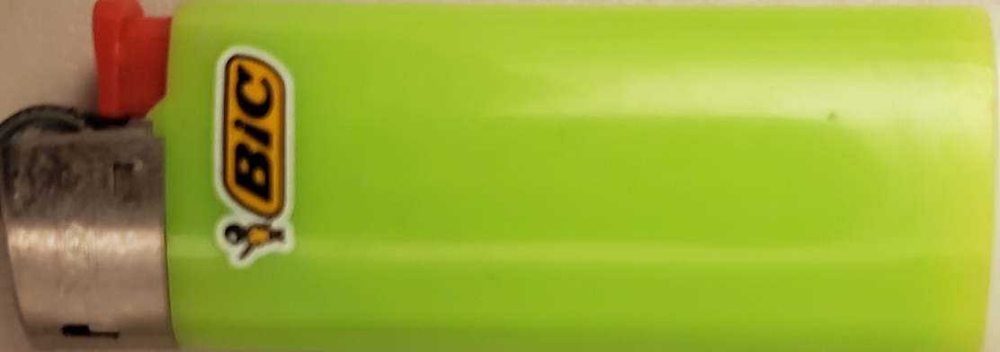


Target Image:


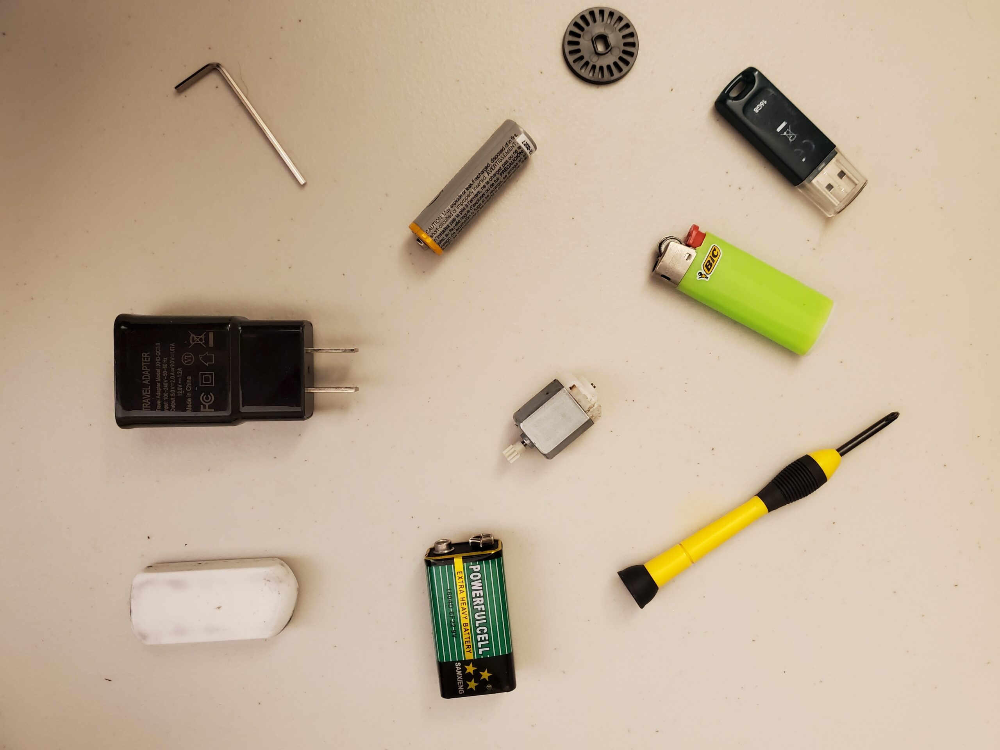


Matches:


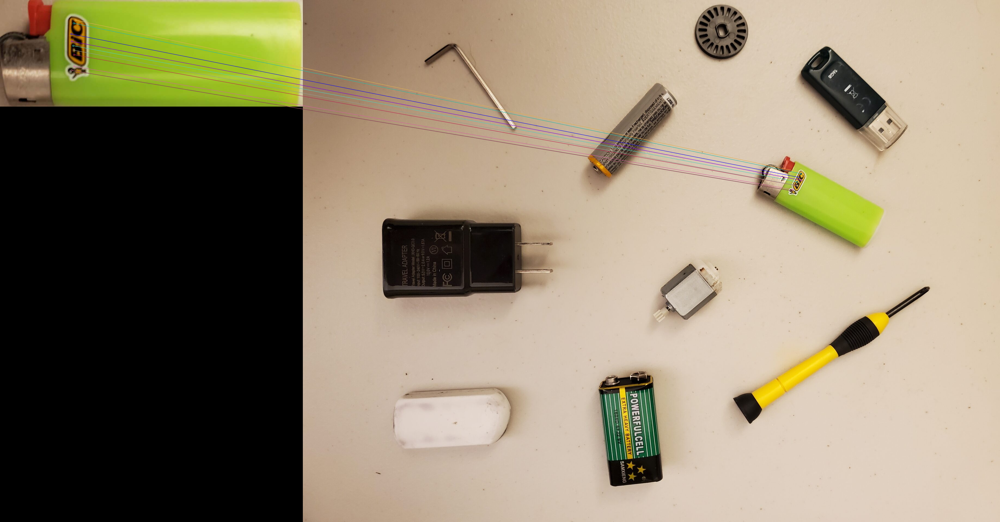


Result Image:


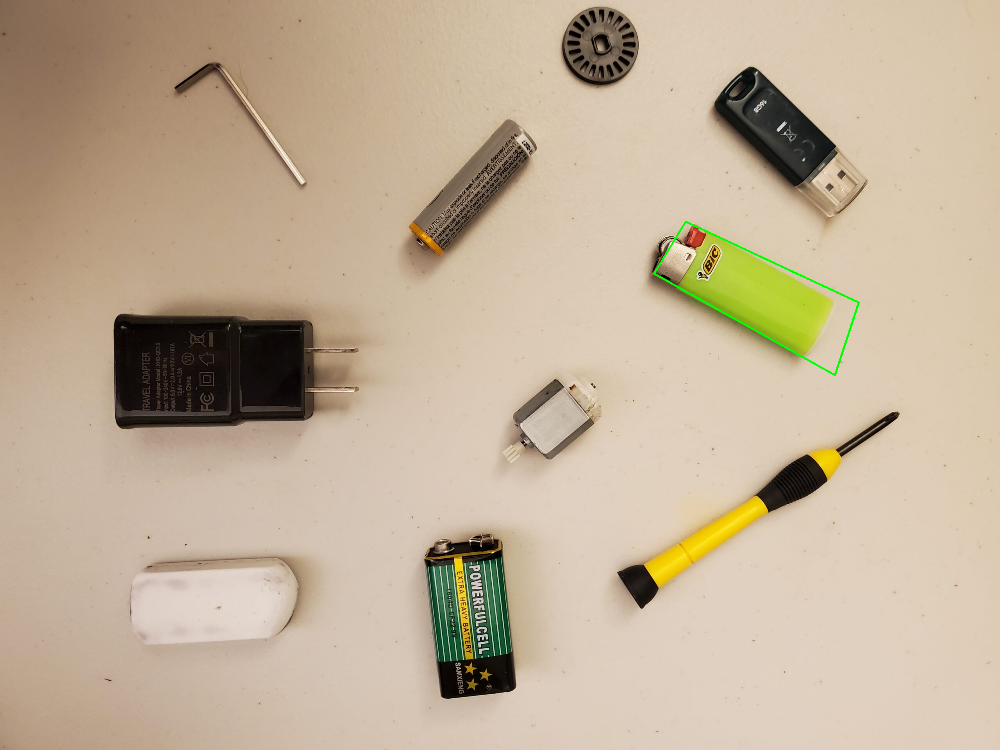

Object detected successfully!


In [10]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def find_object(query_path, target_path, min_matches=10):
    """
    Generic function to find a query object in a target image
    """
    # Read images with error checking
    query_img = cv2.imread(query_path)
    target_img = cv2.imread(target_path)

    # Check if images are loaded successfully
    if query_img is None:
        print(f"Error: Could not load query image from {query_path}")
        return None, False
    if target_img is None:
        print(f"Error: Could not load target image from {target_path}")
        return None, False

    # Create copies for result
    result_img = target_img.copy()

    # Convert to grayscale
    query_gray = cv2.cvtColor(query_img, cv2.COLOR_BGR2GRAY)
    target_gray = cv2.cvtColor(target_img, cv2.COLOR_BGR2GRAY)

    # Initialize SIFT detector
    detector = cv2.SIFT_create(
        nfeatures=0,
        contrastThreshold=0.04,
        edgeThreshold=10
    )

    # Detect keypoints and compute descriptors
    kp1, des1 = detector.detectAndCompute(query_gray, None)
    kp2, des2 = detector.detectAndCompute(target_gray, None)

    # Check if keypoints were found
    if des1 is None or des2 is None:
        print("No keypoints found in one or both images")
        return result_img, False

    # Feature matching
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    matches = bf.knnMatch(des1, des2, k=2)

    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    # Check if enough matches are found
    if len(good_matches) < min_matches:
        print(f"Not enough matches found ({len(good_matches)} < {min_matches})")
        return result_img, False

    # Extract matched keypoints
    query_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    target_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # Find homography
    H, mask = cv2.findHomography(query_pts, target_pts, cv2.RANSAC, 5.0)

    if H is None:
        print("Couldn't find valid homography")
        return result_img, False

    try:
        # Get dimensions of query image
        h, w = query_gray.shape

        # Define corners of query image
        pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)

        # Transform corners to target image coordinates
        dst = cv2.perspectiveTransform(pts, H)

        # Draw bounding box
        result_img = cv2.polylines(result_img, [np.int32(dst)], True, (0, 255, 0), 3)

        # Draw matches
        match_img = cv2.drawMatches(query_img, kp1, target_img, kp2, good_matches[:10], None,
                                  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

        # Return both result and matches image
        return (result_img, match_img), True

    except Exception as e:
        print(f"Error during object detection: {str(e)}")
        return result_img, False

def display_results(query_path, target_path):
    """
    Display results with proper error handling
    """
    try:
        # Read images first to check if they exist
        query_img = cv2.imread(query_path)
        target_img = cv2.imread(target_path)

        if query_img is None:
            print(f"Error: Could not load query image from {query_path}")
            return
        if target_img is None:
            print(f"Error: Could not load target image from {target_path}")
            return

        print("Query Image:")
        cv2_imshow(query_img)

        print("\nTarget Image:")
        cv2_imshow(target_img)

        # Find object
        result, success = find_object(query_path, target_path)

        if success:
            result_img, match_img = result
            print("\nMatches:")
            cv2_imshow(match_img)
            print("\nResult Image:")
            cv2_imshow(result_img)
            print("Object detected successfully!")
        else:
            print("Object detection failed!")

    except Exception as e:
        print(f"Error during processing: {str(e)}")

# Usage
# Make sure to use the correct file names
query_path = 'query_image.jpg'  # Update with your query image path
target_path = 'target_image.jpg'  # Update with your target image path

# Run detection
print("Starting object detection...")
print(f"Query image path: {query_path}")
print(f"Target image path: {target_path}")
display_results(query_path, target_path)